The task is: Character Interaction Networks for George R. R. Martin's "A Song of Ice and Fire" saga

These networks were created by connecting two characters whenever their names (or nicknames) appeared within 15 words of one another in one of the books in "A Song of Ice and Fire." The edge weight corresponds to the number of interactions.


In [ ]:
# importing necessary libaries
%matplotlib inline
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.pyplot import figure
from collections import defaultdict
import numpy as np
import warnings
import sys
import scipy as sp
from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import minimum_spanning_tree
warnings.filterwarnings('ignore')

**QUESTION 1:**

Visualize the data as a graph (use any in-built function)

In [ ]:
book=pd.read_csv('/content/drive/MyDrive/Colab Notebooks/DATA/asoiaf-all-edges_.csv')
book.head(5)

,Source,Target,Type,id,weight
0,Addam-Marbrand,Brynden-Tully,Undirected,0,3
1,Addam-Marbrand,Cersei-Lannister,Undirected,1,3
2,Addam-Marbrand,Gyles-Rosby,Undirected,2,3
3,Addam-Marbrand,Jaime-Lannister,Undirected,3,14
4,Addam-Marbrand,Jalabhar-Xho,Undirected,4,3


In [ ]:
edges = book.groupby(['Source','Target']).agg({'weight':'sum'}).reset_index()
edges.sort_values('weight',ascending=False).head()
edges

,Source,Target,weight
0,Addam-Marbrand,Brynden-Tully,3
1,Addam-Marbrand,Cersei-Lannister,3
2,Addam-Marbrand,Gyles-Rosby,3
3,Addam-Marbrand,Jaime-Lannister,14
4,Addam-Marbrand,Jalabhar-Xho,3
...,...,...,...
2818,Walder-Frey-(son-of-Merrett),Wex-Pyke,4
2819,Waymar-Royce,Will-(prologue),18
2820,Weasel,Weese,6
2821,Woth,Yoren,4


Graph with 796 nodes and 2823 edges


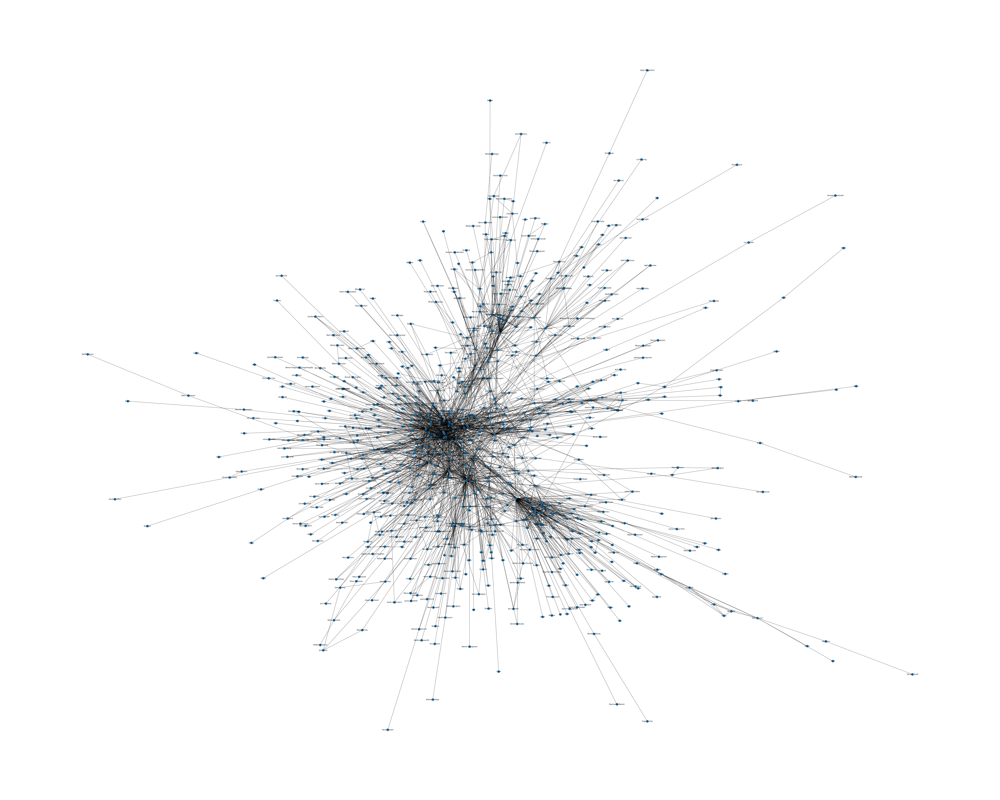

In [ ]:
# Visualizing data as a graph
GOT=nx.Graph()
GOT = nx.from_pandas_edgelist(edges, 
                            source='Source',
                            target='Target',
                            edge_attr='weight' )
print(nx.info(GOT))
figure(figsize=(100,80))
nx.draw(GOT,with_labels=True)

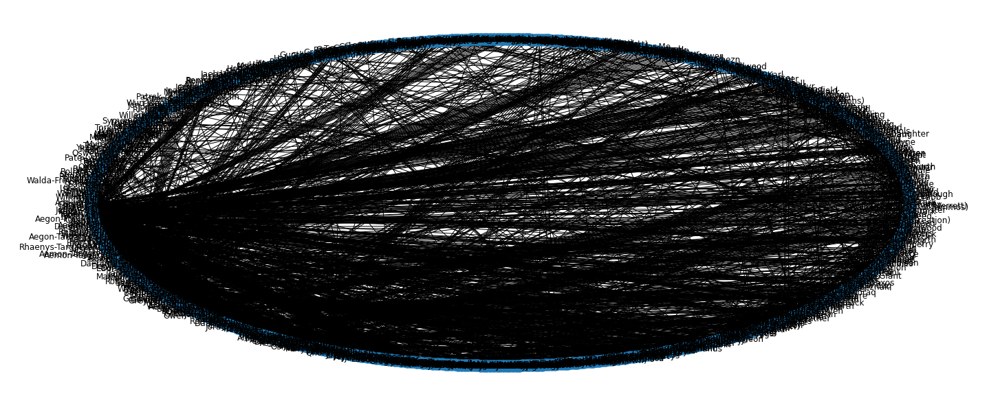

In [ ]:
# Visualizing data as a shell graph
GOT=nx.Graph()
GOT = nx.from_pandas_edgelist(edges, 
                            source='Source',
                            target='Target',
                            edge_attr='weight' )
figure(figsize=(20,8))
nx.draw_shell(GOT,with_labels=True)
plt.show()

**QUESTION 2:**

Identify the most important character. Importance is defined based on the degree of the node 

Maximum degree: 2873


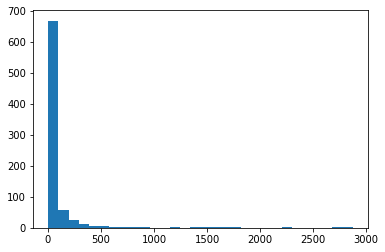

In [ ]:
# As it is a undirected graph, degree is found to identify the most important character

weighted_degrees = dict(nx.degree(GOT,weight='weight'))
max_degree = max(weighted_degrees.values())
import seaborn as sns
h = plt.hist(weighted_degrees.values(), bins = 30)
print('Maximum degree:',max_degree)

In [ ]:
# function to return key for any value
def get_key(val):
    for key, value in weighted_degrees.items():
         if val == value:
             return key 
    return "key doesn't exist"

print('The most important character( i.e. with high weighted degree) : ',get_key(max_degree))

The most important character( i.e. with high weighted degree) :  Tyrion-Lannister


In [ ]:
# Top 5 important characters 
top = pd.DataFrame.from_dict(dict(nx.degree(GOT)),orient='index').sort_values(0,ascending=False)
top.columns = ['Degree']
top['Weighted Degree'] =  pd.DataFrame.from_dict(dict(nx.degree(GOT,weight='weight')),orient='index')
top['PageRank'] = pd.DataFrame.from_dict(dict(nx.pagerank_numpy(GOT,weight='weight')),orient='index')
top['Betweenness'] =  pd.DataFrame.from_dict(dict(nx.betweenness_centrality(GOT,weight='weight')),orient='index')
top.head()

,Degree,Weighted Degree,PageRank,Betweenness
Tyrion-Lannister,122,2873,0.032911,0.091624
Jon-Snow,114,2757,0.035705,0.132120
Jaime-Lannister,101,1569,0.019790,0.116776
Cersei-Lannister,97,2232,0.023665,0.077340
Stannis-Baratheon,89,1375,0.018051,0.092914


**QUESTION 3:**

Find out the shortest path between the characters Addam-Marbrand and Ysilla. The shortest path is used to identify the closeness of two characters in the book.

In [ ]:
# To create adjacency list
l=[]
for i in range(0,2822):
  l1=[]
  l1.append(edges['Source'][i])
  l1.append(edges['Target'][i])
  l.append(l1)

from collections import defaultdict
def build_graph():
    edges = l
    graph = defaultdict(list)
     
    # Loop to iterate over every
    # edge of the graph
    for edge in edges:
        a, b = edge[0], edge[1]
         
        # Creating the graph
        # as adjacency list
        graph[a].append(b)
        graph[b].append(a)
    return graph
 
if __name__ == "__main__":
    graph = build_graph()
     
    print(graph)

defaultdict(<class 'list'>, {'Addam-Marbrand': ['Brynden-Tully', 'Cersei-Lannister', 'Gyles-Rosby', 'Jaime-Lannister', 'Jalabhar-Xho', 'Joffrey-Baratheon', 'Kevan-Lannister', 'Lyle-Crakehall', 'Oberyn-Martell', 'Tyrion-Lannister', 'Tywin-Lannister', 'Varys'], 'Brynden-Tully': ['Addam-Marbrand', 'Arya-Stark', 'Catelyn-Stark', 'Daven-Lannister', 'Edmure-Tully', 'Edwyn-Frey', 'Emmon-Frey', 'Hoster-Tully', 'Jaime-Lannister', 'Lyle-Crakehall', 'Lysa-Arryn', 'Nestor-Royce', 'Rickard-Karstark', 'Robb-Stark', 'Ryman-Frey', 'Theon-Greyjoy', 'Tyrion-Lannister', 'Tywin-Lannister', 'Walder-Frey'], 'Cersei-Lannister': ['Addam-Marbrand', 'Aerys-II-Targaryen', 'Alayaya', 'Amory-Lorch', 'Arya-Stark', 'Arys-Oakheart', 'Aurane-Waters', 'Baelor-I-Targaryen', 'Balman-Byrch', 'Barristan-Selmy', 'Benjen-Stark', 'Blue-Bard', 'Boros-Blount', 'Bran-Stark', 'Brienne-of-Tarth', 'Bronn', 'Catelyn-Stark', 'Chiswyck', 'Cleos-Frey', 'Daenerys-Targaryen', 'Doran-Martell', 'Dorcas', 'Dunsen', 'Eddard-Stark', 'Elia-Mar

In [ ]:
# shortest path using bfs : In-built

G = nx.path_graph(GOT)
if nx.has_path(G, source='Addam-Marbrand', target='Ysilla'):
    path = nx.shortest_path(GOT, source='Addam-Marbrand', target='Ysilla')
    print(path)
else:
    path = None

['Addam-Marbrand', 'Tyrion-Lannister', 'Ysilla']


In [ ]:
# shortest path using bfs : hard coded

def BFS_SP(graph, start, goal):
    explored = []
     
    # Queue for traversing the
    # graph in the BFS
    queue = [[start]]
     
    # If the desired node is
    # reached
    if start == goal:
        print("Same Node")
        return
     
    # Loop to traverse the graph
    # with the help of the queue
    while queue:
        path = queue.pop(0)
        node = path[-1]
         
        # Condition to check if the
        # current node is not visited
        if node not in explored:
            neighbours = graph[node]
             
            # Loop to iterate over the
            # neighbours of the node
            for neighbour in neighbours:
                new_path = list(path)
                new_path.append(neighbour)
                queue.append(new_path)
                 
                # Condition to check if the
                # neighbour node is the goal
                if neighbour == goal:
                    print("Shortest path = ", *new_path)
                    return
            explored.append(node)
 
    # Condition when the nodes
    # are not connected
    print("So sorry, but a connecting"\
                "path doesn't exist :(")
    return
 
# Driver Code
if __name__ == "__main__":
     
  BFS_SP(graph, 'Addam-Marbrand', 'Ysilla')

Shortest path =  Addam-Marbrand Tyrion-Lannister Ysilla


# **As the data is weighted ,for shortest path we have to go for dijkstra algorithm**



In [ ]:
# USING IN-BUILT FUNCTION
nx.has_path(G, source='Addam-Marbrand', target='Ysilla')

if nx.has_path(G, source='Addam-Marbrand', target='Ysilla'):
  length, path = nx.single_source_dijkstra(GOT,source='Addam-Marbrand', target='Ysilla')
  print('Shortest path :',path,'\nThe cost of the path=',length)
else:
    path = None

Shortest path : ['Addam-Marbrand', 'Tywin-Lannister', 'Aegon-Targaryen-(son-of-Rhaegar)', 'Ysilla'] 
The cost of the path= 13


In [ ]:
 # HARD CODED DIJIKSTRA ALGORITHM FOR FINDING SHORTEST PATH
class Graph():
    def __init__(self):
        self.edges = defaultdict(list)
        self.weights = {}
    
    def add_edge(self, from_node, to_node, weight):
        # Note: assumes edges are bi-directional
        self.edges[from_node].append(to_node)
        self.edges[to_node].append(from_node)
        self.weights[(from_node, to_node)] = weight
        self.weights[(to_node, from_node)] = weight

graph = Graph()
for edge in np.asarray(edges):
    graph.add_edge(*edge)

def dijsktra(graph, initial, end):
    # shortest paths is a dict of nodes
    # whose value is a tuple of (previous node, weight)
    shortest_paths = {initial: (None, 0)}
    current_node = initial
    visited = set()
    
    while current_node != end:
        visited.add(current_node)
        destinations = graph.edges[current_node]
        weight_to_current_node = shortest_paths[current_node][1]

        for next_node in destinations:
            weight = graph.weights[(current_node, next_node)] + weight_to_current_node
            if next_node not in shortest_paths:
                shortest_paths[next_node] = (current_node, weight)
            else:
                current_shortest_weight = shortest_paths[next_node][1]
                if current_shortest_weight > weight:
                    shortest_paths[next_node] = (current_node, weight)
        
        next_destinations = {node: shortest_paths[node] for node in shortest_paths if node not in visited}
        if not next_destinations:
            return "Route Not Possible"
        # next node is the destination with the lowest weight
        current_node = min(next_destinations, key=lambda k: next_destinations[k][1])
    
    # Work back through destinations in shortest path
    path = []
    while current_node is not None:
        path.append(current_node)
        next_node = shortest_paths[current_node][0]
        current_node = next_node
    # Reverse path
    path = path[::-1]
    return path

In [ ]:
print('Shortest path for weighted graph:', dijsktra(graph, 'Addam-Marbrand', 'Ysilla'))

Shortest path for weighted graph: ['Addam-Marbrand', 'Tywin-Lannister', 'Aegon-Targaryen-(son-of-Rhaegar)', 'Ysilla']


**QUESTION 4:**

Obtain the minimum spanning tree for the graph.

In [ ]:
# TO CREATE ADJACENCY MATRIX
lf=[]
for i in range(0,2822):
  lk=()
  lk=lk+((edges['Source'][i],edges['Target'][i],{'weight':edges['weight'][i]}))
  lf.append(lk)

filter = lf
G = nx.MultiGraph()
G.add_edges_from(filter)
print(G)
X = nx.to_numpy_matrix(G)

X = csr_matrix(X)
Tcsr = minimum_spanning_tree(X)

MultiGraph with 796 nodes and 2822 edges


In [ ]:
# MINIMUM SPANNING TREE ALGORITHM

TAR=[]  
SRC=[]
WEI=[]
class Graph(): 
  
    def __init__(self, vertices): 
        self.V = vertices 
        self.graph = [[0 for column in range(vertices)]  
                    for row in range(vertices)] 
    def printTree(self, parent): 
        # print("Edge \tWeight")
        for i in range(1, self.V): 
            SRC.append(parent[i])
            TAR.append(i)
            WEI.append(self.graph[i][ parent[i] ])
            #print(parent[i], "-", i, "\t", self.graph[i][ parent[i] ])

    def min_Key(self, key, mstSet): 
        min = sys.maxsize 
  
        for v in range(self.V): 
            if key[v] < min and mstSet[v] == False: 
                min = key[v] 
                min_index = v 
  
        return min_index 
    def prim(self): 
        key = [sys.maxsize] * self.V 
        parent = [None] * self.V 
        key[0] = 0 
        mstSet = [False] * self.V 
  
        parent[0] = -1 
  
        for cout in range(self.V):  
            u = self.min_Key(key, mstSet)  
            mstSet[u] = True
            for v in range(self.V):  
              if (self.graph[u][v] > 0 and mstSet[v] == False and key[v] > self.graph[u][v]): 
                        key[v] = self.graph[u][v] 
                        parent[v] = u 
  
        self.printTree(parent) 
  
g = Graph(796) 
g.graph = X.toarray().astype(int)
li=g.prim(); 
dft=pd.DataFrame({'Source':SRC,'Target':TAR,'Weights':WEI})
#print('Minimum spanning tree',dft)

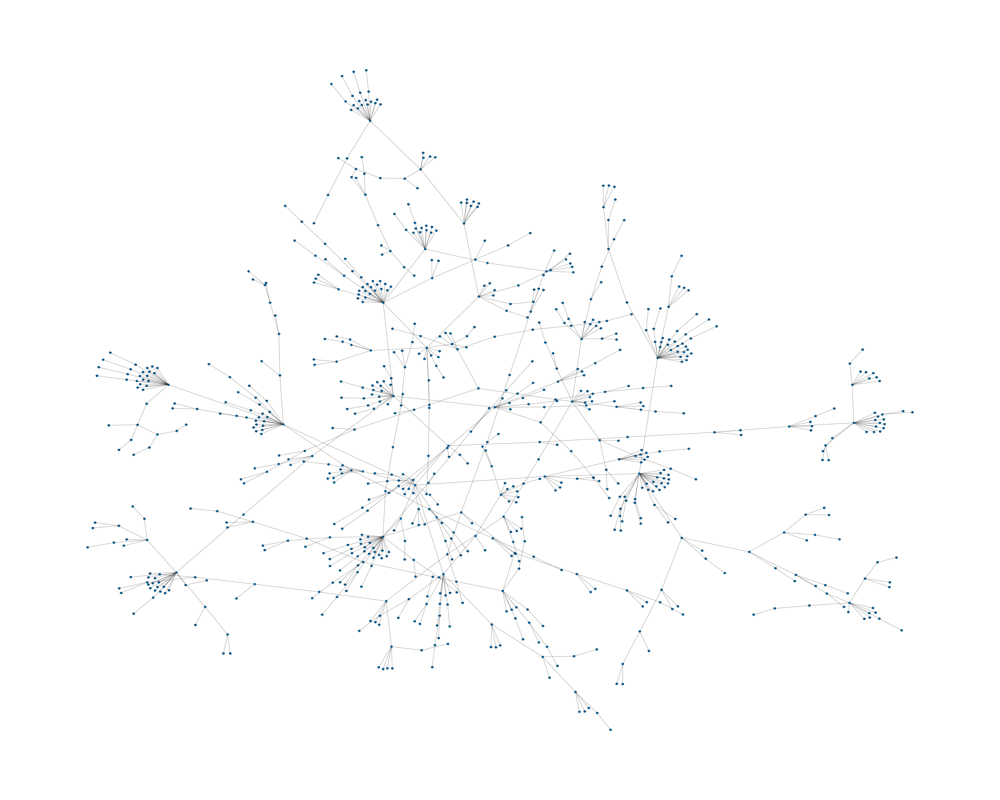

In [ ]:
mst = nx.Graph()
mst = nx.from_pandas_edgelist(dft, 
                            source='Source',
                            target='Target',
                            edge_attr='Weights' )
figure(figsize=(100,80))
nx.draw(mst,with_labels=True)
plt.show()

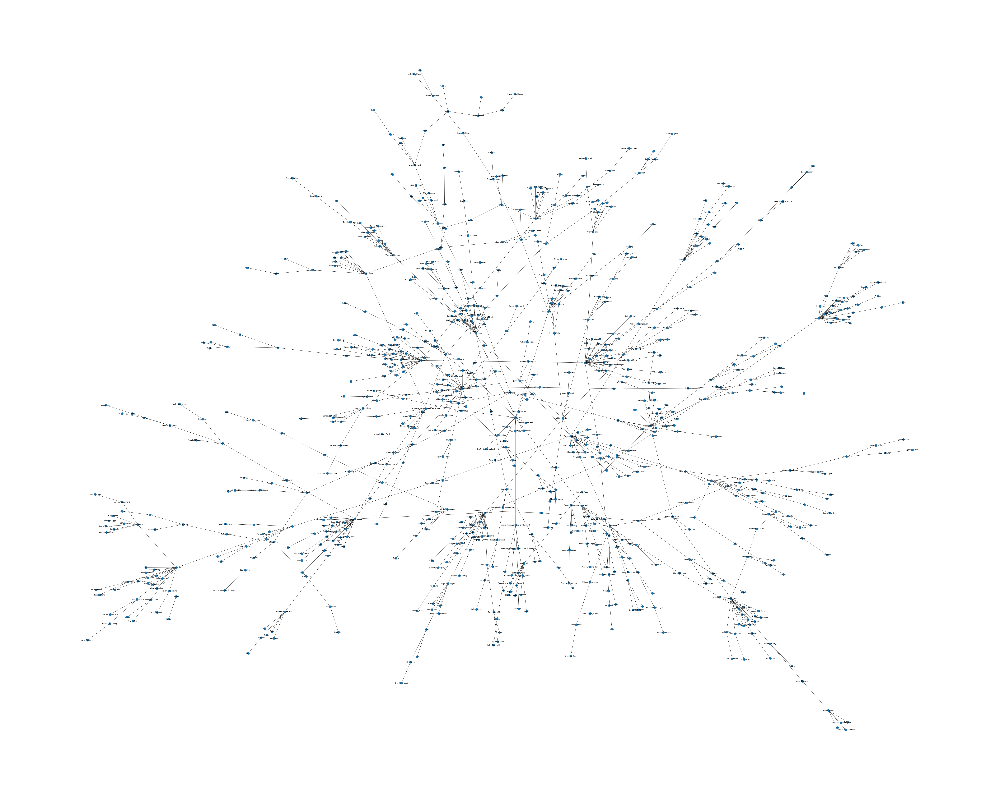

In [ ]:
# MINIMUM SPANNING TREE USING IN-BUILT
T=nx.minimum_spanning_tree(GOT)
figure(figsize=(100,80))
nx.draw(T,with_labels=True)